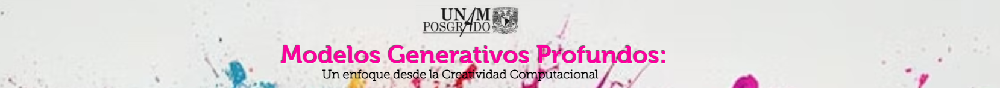

# Modelos de Difusión

En esta libreta recorreremos paso a paso el proceso necesario para entrenar tu propio modelo de difusión utilizando el conjunto de datos Oxford Flowers.

In [5]:
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("seaborn-v0_8-colorblind")

import math

import tensorflow as tf
from tensorflow.keras import (
    layers,
    models,
    optimizers,
    utils,
    callbacks,
    metrics,
    losses,
    activations,
)

import tensorflow_datasets as tfds
from keras.saving import register_keras_serializable
import os

## 0. Parámetros

In [6]:
IMAGE_SIZE = 64
BATCH_SIZE = 64
DATASET_REPETITIONS = 5
LOAD_MODEL = True

NOISE_EMBEDDING_SIZE = 32
PLOT_DIFFUSION_STEPS = 20

# optimización
EMA = 0.999
LEARNING_RATE = 1e-3
WEIGHT_DECAY = 1e-4
EPOCHS = 50

## 1. Preparación de los datos

<section>
  <h3>1.1 Carga de credenciales de Kaggle</h3>
  <p>
    Para descargar el dataset directamente desde <strong>Kaggle</strong>, necesitamos autenticarnos con un archivo de credenciales llamado <code>kaggle.json</code>. Este archivo contiene tu <em>API Key</em> personal de Kaggle y permite que Colab acceda a los datos sin iniciar sesión manualmente.
  </p>

  <h4>Pasos previos</h4>
  <ol>
    <li>Entra a <a href="https://www.kaggle.com/" target="_blank" rel="noopener">kaggle.com</a>.</li>
    <li>Haz clic en tu foto de perfil &rarr; <strong>Account</strong>.</li>
    <li>Desplázate a la sección <strong>API</strong> y presiona <strong>Create New API Token</strong>.</li>
    <li>Se descargará el archivo <code>kaggle.json</code> en tu computadora.</li>
    <li>Ejecuta la siguiente celda y, cuando se abra el diálogo, <strong>sube el archivo</strong> <code>kaggle.json</code>.</li>
  </ol>

  <p>
    Una vez cargado, el archivo se ubicará temporalmente en <code>/content/</code> y lo moveremos a la ruta esperada por la CLI de Kaggle (<code>~/.kaggle/</code>) en la celda siguiente.
  </p>

  <div style="background:#fff3cd;border:1px solid #ffeeba;border-radius:6px;padding:12px;margin-top:10px;">
    <strong>Importante:</strong> <code>kaggle.json</code> contiene credenciales privadas. No lo compartas ni lo subas a repositorios públicos.
    Cada vez que reinicies el entorno de Colab deberás cargarlo de nuevo.
  </div>
</section>


<h3>1.2 Configuración del acceso a Kaggle</h3>

<p>
Crea la carpeta oculta <code>~/.kaggle</code>, mueve allí el archivo <code>kaggle.json</code> con la clave de API, ajusta sus permisos por seguridad
y ejecuta un comando de búsqueda (<code>kaggle datasets list -s "flowers"</code>) para verificar que la conexión con Kaggle funciona correctamente.
</p>

In [ ]:
!mkdir -p ~/.kaggle
!mv /content/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets list -s "flowers"


<h3>1.3 Descarga y extracción del dataset</h3>

<p>
Instala la librería <code>kaggle</code> y configura las credenciales necesarias para acceder a la plataforma.
Luego descarga el dataset <strong>pytorch-challange-flower-dataset</strong> directamente desde Kaggle y lo descomprime en la carpeta <code>/content/flowers</code>.
Con esto, las imágenes quedan listas para ser utilizadas en el entrenamiento del modelo de difusión.
</p>


In [ ]:
# subir tu kaggle.json con tus credenciales
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d nunenuh/pytorch-challange-flower-dataset
!unzip pytorch-challange-flower-dataset.zip -d /content/flowers

<h3>1.4 Carga del dataset como conjunto de entrenamiento</h3>

<p>
Se cargan las imágenes del directorio <code>/content/flowers/dataset</code> en formato de tensores, listos para ser procesados por el modelo.
La función <code>image_dataset_from_directory()</code> convierte automáticamente las imágenes en un conjunto de datos de TensorFlow,
ajustando su tamaño a <code>(IMAGE_SIZE, IMAGE_SIZE)</code>, aplicando interpolación bilineal, barajando el orden de las muestras
y omitiendo etiquetas (<code>labels=None</code>), ya que el modelo de difusión no las requiere.
</p>


In [8]:
# Cargar el dataset
train_data = utils.image_dataset_from_directory(
    "./datasets/flowers/train",
    labels=None,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=None,
    shuffle=True,
    seed=42,
    interpolation="bilinear",
)

Found 2746 files.


2025-10-27 12:04:49.619575: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3 Pro
2025-10-27 12:04:49.619713: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 18.00 GB
2025-10-27 12:04:49.619729: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 6.66 GB
I0000 00:00:1761588289.620062 2176555 pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
I0000 00:00:1761588289.620220 2176555 pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


<h3>1.5 Preprocesamiento del dataset</h3>

<p>
Normaliza las imágenes al rango <code>[0, 1]</code> convirtiendo sus valores de píxeles a tipo <code>float32</code>.
Luego crea un conjunto de datos preparado para el entrenamiento, repitiendo las muestras <code>DATASET_REPETITIONS</code> veces
y agrupándolas en lotes de tamaño <code>BATCH_SIZE</code>. De este modo, las imágenes quedan listas para ser utilizadas por el modelo de difusión.
</p>

<p>
<strong>Nota:</strong> Se repite el dataset <code>DATASET_REPETITIONS</code> veces para permitir un entrenamiento prolongado sin detener el flujo de datos,
ya que los modelos de difusión requieren muchas iteraciones sobre las mismas imágenes.
</p>



In [9]:
# Preprocesamiento de los datos
def preprocess(img):
    img = tf.cast(img, "float32") / 255.0
    return img

train = train_data.map(lambda x: preprocess(x))
train = train.repeat(DATASET_REPETITIONS)
train = train.batch(BATCH_SIZE, drop_remainder=True)

In [10]:
def sample_batch(dataset):
    batch = dataset.take(1).get_single_element()
    if isinstance(batch, tuple):
        batch = batch[0]
    return batch.numpy()

In [11]:
def display(images, n=10, size=(20, 3), cmap=None, save_to=None):
    """
    Despliega hasta n imágenes.
    Ajusta automáticamente el rango de valores y muestra correctamente
    tensores o arreglos numpy con forma (N, H, W, C).
    """
    # Convertir tensor a numpy si es necesario
    if isinstance(images, tf.Tensor):
        images = images.numpy()

    # Asegurar tipo float
    images = images.astype("float32")

    # Normalización automática al rango [0, 1]
    if images.max() > 1.0:
        images = images / 255.0
    elif images.min() < 0.0:
        images = (images + 1.0) / 2.0

    n = min(n, len(images))
    plt.figure(figsize=size)
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow(np.clip(images[i], 0, 1), cmap=cmap)
        plt.axis("off")

    if save_to:
        plt.savefig(save_to, bbox_inches="tight", dpi=150)
        print(f"\n💾 Imagen guardada en: {save_to}")

    plt.tight_layout()
    plt.show()


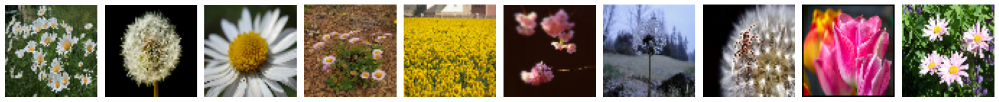

In [12]:
# Muestra algunas imágenes de ejemplo
train_sample = sample_batch(train)
display(train_sample)

### 1.6 Diffusion schedules <a name="diffusion_schedules"></a>

In [13]:
def linear_diffusion_schedule(diffusion_times):
    min_rate = 0.0001
    max_rate = 0.02
    betas = min_rate + diffusion_times * (max_rate - min_rate)
    alphas = 1 - betas
    alpha_bars = tf.math.cumprod(alphas)
    signal_rates = tf.sqrt(alpha_bars)
    noise_rates = tf.sqrt(1 - alpha_bars)
    return noise_rates, signal_rates

In [14]:
def cosine_diffusion_schedule(diffusion_times):
    signal_rates = tf.cos(diffusion_times * math.pi / 2)
    noise_rates = tf.sin(diffusion_times * math.pi / 2)
    return noise_rates, signal_rates

In [15]:
@register_keras_serializable()
def offset_cosine_diffusion_schedule(diffusion_times):
    min_signal_rate = 0.02
    max_signal_rate = 0.95
    start_angle = tf.acos(max_signal_rate)
    end_angle = tf.acos(min_signal_rate)

    diffusion_angles = start_angle + diffusion_times * (end_angle - start_angle)

    signal_rates = tf.cos(diffusion_angles)
    noise_rates = tf.sin(diffusion_angles)

    return noise_rates, signal_rates

In [16]:
T = 1000
diffusion_times = tf.convert_to_tensor([x / T for x in range(T)])
linear_noise_rates, linear_signal_rates = linear_diffusion_schedule(
    diffusion_times
)
cosine_noise_rates, cosine_signal_rates = cosine_diffusion_schedule(
    diffusion_times
)
(
    offset_cosine_noise_rates,
    offset_cosine_signal_rates,
) = offset_cosine_diffusion_schedule(diffusion_times)

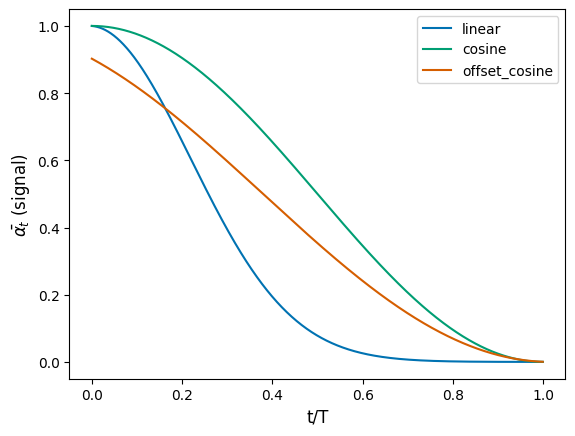

In [17]:
plt.plot(
    diffusion_times, linear_signal_rates**2, linewidth=1.5, label="linear"
)
plt.plot(
    diffusion_times, cosine_signal_rates**2, linewidth=1.5, label="cosine"
)
plt.plot(
    diffusion_times,
    offset_cosine_signal_rates**2,
    linewidth=1.5,
    label="offset_cosine",
)

plt.xlabel("t/T", fontsize=12)
plt.ylabel(r"$\bar{\alpha_t}$ (signal)", fontsize=12)
plt.legend()
plt.show()

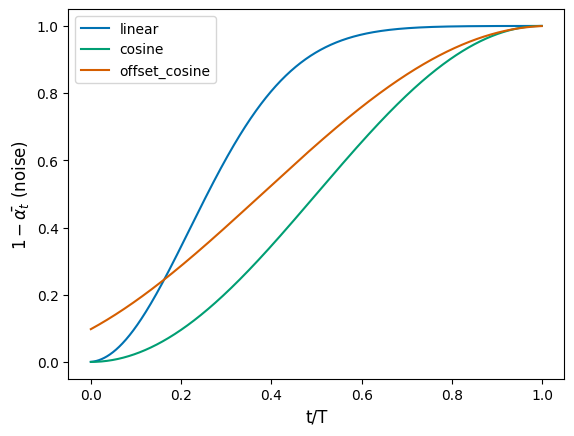

In [18]:
plt.plot(
    diffusion_times, linear_noise_rates**2, linewidth=1.5, label="linear"
)
plt.plot(
    diffusion_times, cosine_noise_rates**2, linewidth=1.5, label="cosine"
)
plt.plot(
    diffusion_times,
    offset_cosine_noise_rates**2,
    linewidth=1.5,
    label="offset_cosine",
)

plt.xlabel("t/T", fontsize=12)
plt.ylabel(r"$1-\bar{\alpha_t}$ (noise)", fontsize=12)
plt.legend()
plt.show()

## 2. Construir el modelo

<h3> 2.1 Codificación sinusoidal del paso de ruido</h3>


In [19]:
@register_keras_serializable()
def sinusoidal_embedding(x):
    frequencies = tf.exp(
        tf.linspace(
            tf.math.log(1.0),
            tf.math.log(1000.0),
            NOISE_EMBEDDING_SIZE // 2,
        )
    )
    angular_speeds = 2.0 * math.pi * frequencies
    embeddings = tf.concat(
        [tf.sin(angular_speeds * x), tf.cos(angular_speeds * x)], axis=3
    )
    return embeddings

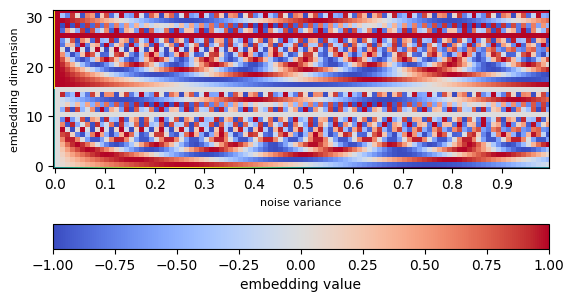

In [20]:
embedding_list = []
for y in np.arange(0, 1, 0.01):
    embedding_list.append(sinusoidal_embedding(np.array([[[[y]]]]))[0][0][0])
embedding_array = np.array(np.transpose(embedding_list))
fig, ax = plt.subplots()
ax.set_xticks(
    np.arange(0, 100, 10), labels=np.round(np.arange(0.0, 1.0, 0.1), 1)
)
ax.set_ylabel("embedding dimension", fontsize=8)
ax.set_xlabel("noise variance", fontsize=8)
plt.pcolor(embedding_array, cmap="coolwarm")
plt.colorbar(orientation="horizontal", label="embedding value")
ax.imshow(embedding_array, interpolation="nearest", origin="lower")
plt.show()

<h3>2.2 Definición de Bloque residual, DownBlock y UpBlock</h3>

In [21]:
def ResidualBlock(width):
    def apply(x):
        input_width = x.shape[3]
        if input_width == width:
            residual = x
        else:
            residual = layers.Conv2D(width, kernel_size=1)(x)
        x = layers.BatchNormalization(center=False, scale=False)(x)
        x = layers.Conv2D(
            width, kernel_size=3, padding="same", activation=activations.swish
        )(x)
        x = layers.Conv2D(width, kernel_size=3, padding="same")(x)
        x = layers.Add()([x, residual])
        return x

    return apply


def DownBlock(width, block_depth):
    def apply(x):
        x, skips = x
        for _ in range(block_depth):
            x = ResidualBlock(width)(x)
            skips.append(x)
        x = layers.AveragePooling2D(pool_size=2)(x)
        return x

    return apply


def UpBlock(width, block_depth):
    def apply(x):
        x, skips = x
        x = layers.UpSampling2D(size=2, interpolation="bilinear")(x)
        for _ in range(block_depth):
            x = layers.Concatenate()([x, skips.pop()])
            x = ResidualBlock(width)(x)
        return x

    return apply

2.3 Construcción de la arquitectura U-NET

In [22]:
# Construcción de la U-Net

noisy_images = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
x = layers.Conv2D(32, kernel_size=1)(noisy_images)

noise_variances = layers.Input(shape=(1, 1, 1))
noise_embedding = layers.Lambda(sinusoidal_embedding)(noise_variances)
noise_embedding = layers.UpSampling2D(size=IMAGE_SIZE, interpolation="nearest")(
    noise_embedding
)

x = layers.Concatenate()([x, noise_embedding])

skips = []

x = DownBlock(32, block_depth=2)([x, skips])
x = DownBlock(64, block_depth=2)([x, skips])
x = DownBlock(96, block_depth=2)([x, skips])

x = ResidualBlock(128)(x)
x = ResidualBlock(128)(x)

x = UpBlock(96, block_depth=2)([x, skips])
x = UpBlock(64, block_depth=2)([x, skips])
x = UpBlock(32, block_depth=2)([x, skips])

x = layers.Conv2D(3, kernel_size=1, kernel_initializer="zeros")(x)

unet = models.Model([noisy_images, noise_variances], x, name="unet")

<h3>2.4 Clase <code>DiffusionModel</code></h3>

<p>
Esta clase implementa el modelo completo de difusión basado en la arquitectura U-Net.
Incluye la normalización de datos, la red principal (<code>network</code>) y su versión con promediado exponencial de pesos (<em>EMA</em>)
para estabilizar el entrenamiento. Define los métodos para el proceso de <strong>denoising</strong>,
la <strong>difusión inversa</strong> que genera nuevas imágenes a partir de ruido, y los pasos de entrenamiento y prueba
(<code>train_step</code> y <code>test_step</code>). En cada iteración, el modelo aprende a predecir el ruido añadido a las imágenes
para luego poder revertir progresivamente ese proceso y sintetizar imágenes realistas desde ruido puro.
</p>


In [23]:
@register_keras_serializable()
class DiffusionModel(models.Model):

    def __init__(self, **kwargs):
        super().__init__(**kwargs)

        # --- Normalizer configurado para persistir sus estadísticas ---
        self.normalizer = layers.Normalization(name="input_normalizer")
        self.normalizer.stateful = True       # guarda mean/var en el modelo
        self.normalizer.trainable = False     # evita que se actualice accidentalmente
        self.normalizer.build((None, IMAGE_SIZE, IMAGE_SIZE, 3))  # usa tu constante global

        # --- Resto del modelo ---
        self.network = unet
        self.ema_network = models.clone_model(self.network)
        self.diffusion_schedule = offset_cosine_diffusion_schedule

    def compile(self, **kwargs):
        super().compile(**kwargs)
        self.noise_loss_tracker = metrics.Mean(name="n_loss")

    @property
    def metrics(self):
        return [self.noise_loss_tracker]

    def denormalize(self, images):
        weights = self.normalizer.get_weights()

        # Si la capa no tiene pesos (no adaptada o vacía)
        if len(weights) < 2:
          # Asume que ya están en [0,1], solo recorta por seguridad
          return tf.clip_by_value(images, 0.0, 1.0)

        # Caso normal: [mean, var, (gamma, beta) opcionales]
        mean = weights[0]
        var = weights[1]

        # Broadcast a la forma de la imagen
        images = mean + images * np.sqrt(var)
        return tf.clip_by_value(images, 0.0, 1.0)

    def denoise(self, noisy_images, noise_rates, signal_rates, training):
        if training:
            network = self.network
        else:
            network = self.ema_network
        pred_noises = network(
            [noisy_images, noise_rates**2], training=training
        )
        pred_images = (noisy_images - noise_rates * pred_noises) / signal_rates

        return pred_noises, pred_images

    def reverse_diffusion(self, initial_noise, diffusion_steps):
        num_images = initial_noise.shape[0]
        step_size = 1.0 / diffusion_steps
        current_images = initial_noise
        for step in range(diffusion_steps):
            diffusion_times = tf.ones((num_images, 1, 1, 1)) - step * step_size
            noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
            pred_noises, pred_images = self.denoise(
                current_images, noise_rates, signal_rates, training=False
            )
            next_diffusion_times = diffusion_times - step_size
            next_noise_rates, next_signal_rates = self.diffusion_schedule(
                next_diffusion_times
            )
            current_images = (
                next_signal_rates * pred_images + next_noise_rates * pred_noises
            )
        return pred_images

    def generate(self, num_images, diffusion_steps, initial_noise=None):
        if initial_noise is None:
            initial_noise = tf.random.normal(
                shape=(num_images, IMAGE_SIZE, IMAGE_SIZE, 3)
            )
        generated_images = self.reverse_diffusion(
            initial_noise, diffusion_steps
        )
        generated_images = self.denormalize(generated_images)
        return generated_images

    def train_step(self, images):
        images = self.normalizer(images, training=True)
        noises = tf.random.normal(shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, 3))

        diffusion_times = tf.random.uniform(
            shape=(BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)

        noisy_images = signal_rates * images + noise_rates * noises

        with tf.GradientTape() as tape:
            # Entrena la red para separar imágenes ruidosas en sus componentes
            pred_noises, pred_images = self.denoise(
                noisy_images, noise_rates, signal_rates, training=True
            )

            noise_loss = self.loss(noises, pred_noises)  # used for training

        gradients = tape.gradient(noise_loss, self.network.trainable_weights)
        self.optimizer.apply_gradients(
            zip(gradients, self.network.trainable_weights)
        )

        self.noise_loss_tracker.update_state(noise_loss)

        for weight, ema_weight in zip(
            self.network.weights, self.ema_network.weights
        ):
            ema_weight.assign(EMA * ema_weight + (1 - EMA) * weight)

        return {m.name: m.result() for m in self.metrics}

    def test_step(self, images):
        images = self.normalizer(images, training=False)
        noises = tf.random.normal(shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, 3))
        diffusion_times = tf.random.uniform(
            shape=(BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
        noisy_images = signal_rates * images + noise_rates * noises
        pred_noises, pred_images = self.denoise(
            noisy_images, noise_rates, signal_rates, training=False
        )
        noise_loss = self.loss(noises, pred_noises)
        self.noise_loss_tracker.update_state(noise_loss)

        return {m.name: m.result() for m in self.metrics}

In [24]:
ddm = DiffusionModel()
ddm.normalizer.adapt(train)

2025-10-27 12:05:46.368445: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [25]:
import glob
import re

# Ruta del checkpoint en Google Drive
base_dir = "./"
checkpoint_dir = os.path.join(base_dir, "checkpoints")
model_dir = os.path.join(base_dir, "models")

os.makedirs(checkpoint_dir, exist_ok=True)
os.makedirs(model_dir, exist_ok=True)

INITIAL_EPOCH = 0

# --- Buscar el último checkpoint de Keras (.weights.h5) ---
checkpoints = sorted(glob.glob(os.path.join(checkpoint_dir, "epoch_*.weights.h5")))
latest_ckpt = checkpoints[-1] if checkpoints else None


if LOAD_MODEL and latest_ckpt:
    print(f"Reanudando desde el checkpoint: {latest_ckpt}")
    ddm.built = True
    ddm.load_weights(latest_ckpt)
    # Extraer número de época del nombre del archivo
    match = re.search(r"epoch_(\d+)\.weights\.h5", os.path.basename(latest_ckpt))
    INITIAL_EPOCH = int(match.group(1))
    print(f"Epoch inicial detectada: {INITIAL_EPOCH}")
else:
    print("Iniciando entrenamiento desde cero.")
    latest_ckpt = None


Iniciando entrenamiento desde cero.


## 3.Entrenar el modelo

In [26]:
ddm.compile(
    optimizer=optimizers.AdamW(
        learning_rate=LEARNING_RATE,
        weight_decay=WEIGHT_DECAY
    ),
    loss=losses.MeanAbsoluteError(),
)


In [27]:
log_dir = os.path.join(base_dir, "logs")
output_dir = os.path.join(base_dir, "output")
os.makedirs(log_dir, exist_ok=True)
os.makedirs(output_dir, exist_ok=True)


# --- Callback 1: guardar checkpoints en cada época ---
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath=os.path.join(checkpoint_dir, "epoch_{epoch:03d}.weights.h5"),
    save_weights_only=True,
    save_freq="epoch",
    verbose=1,
)

# --- Callback: guardar modelo completo y EMA en épocas específicas ---
class SaveFullModel(tf.keras.callbacks.Callback):
    def __init__(self, epochs_to_save=None):
        super().__init__()
        self.epochs_to_save = epochs_to_save if epochs_to_save is not None else []

    def on_epoch_end(self, epoch, logs=None):
        current_epoch = epoch + 1
        if current_epoch in self.epochs_to_save:
            # Copiar pesos EMA al modelo principal antes de guardar
            if hasattr(self.model, "ema_network"):
                self.model.network.set_weights(self.model.ema_network.get_weights())
                print("Copiados pesos EMA al modelo principal antes de guardar.")

            model_path = os.path.join(
                model_dir, f"ddm_full_model_epoch_{current_epoch:03d}.keras"
            )
            self.model.save(model_path)
            print(f"Modelo completo (con EMA) guardado en: {model_path}")



# --- Callback 3: registro para TensorBoard ---
tensorboard_callback = callbacks.TensorBoard(log_dir=log_dir)

# ----Callback 4: generar y guardar imágenes cada época
class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generate(
            num_images=self.num_img,
            diffusion_steps=PLOT_DIFFUSION_STEPS,
        ).numpy()

        save_path = os.path.join(output_dir, f"generated_img_{epoch+1:03d}.png")
        display(generated_images, save_to=save_path)
        print(f"Imágenes generadas guardadas en: {save_path}")

image_generator_callback = ImageGenerator(num_img=10)

# --- Forzar construcción del modelo antes de entrenar ---
example_batch = next(iter(train.take(1)))
dummy_noise = tf.ones((example_batch.shape[0], 1, 1, 1))
_ = ddm.network([example_batch, dummy_noise], training=False)
ddm.built = True
print("Modelo construido y listo para entrenar.")

Modelo construido y listo para entrenar.


In [28]:
# Adaptar el normalizador antes de entrenar
ddm.normalizer.adapt(train)

2025-10-27 12:07:06.272241: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [ ]:
epochs_to_save = [1, 4, 8, 11, 50]
save_full_model_callback = SaveFullModel(epochs_to_save=epochs_to_save)

history=ddm.fit(
    train,
    epochs=EPOCHS,
    initial_epoch=INITIAL_EPOCH,
    #steps_per_epoch=1,   # solo un batch
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        image_generator_callback,
        save_full_model_callback,
    ],
)

## 4. Generación de imágenes

###4.1 Cargar el modelo entrenado previamente

In [53]:
# Ruta al modelo completo guardado en Drive
model_path = "./ddm_full_model_epoch_050.keras"

# Cargar el modelo completo
loaded_ddm = tf.keras.models.load_model(model_path, compile=False)

print("Modelo cargado correctamente desde:", model_path)

Modelo cargado correctamente desde: ./ddm_full_model_epoch_050.keras


###4.2 Generación de imágenes aleatorias desde el modelo cargado

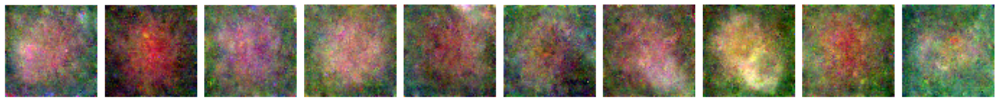

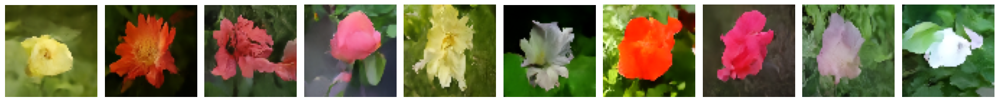

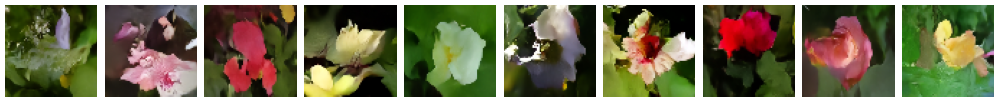

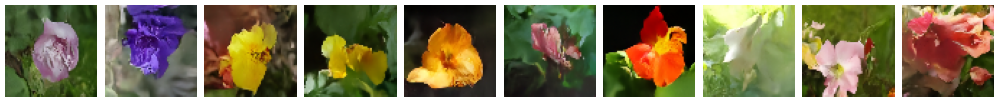

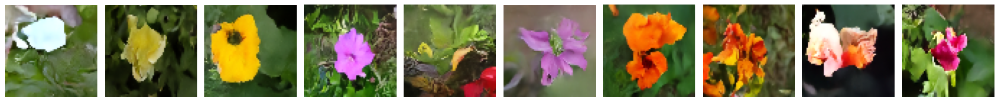

In [54]:
# Generación de imágenes aleatorias desde el modelo cargado

for i in range(1,50, 10):
    generated_images = loaded_ddm.generate(num_images=10, diffusion_steps=1 * i).numpy()
    display(generated_images)


###4.2 Observar la mejora usando diferentes valores de pasos de difusión

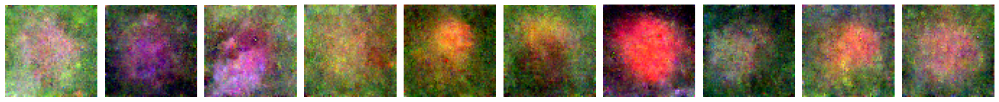

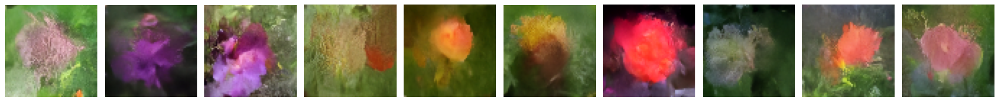

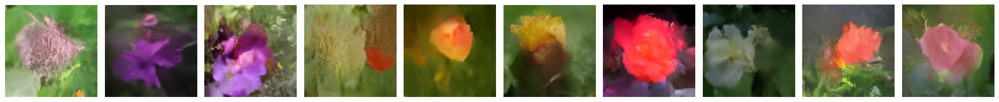

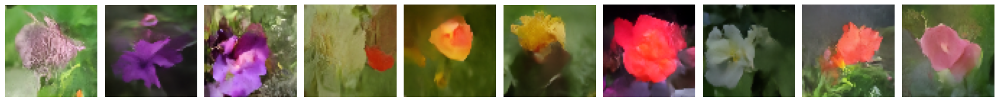

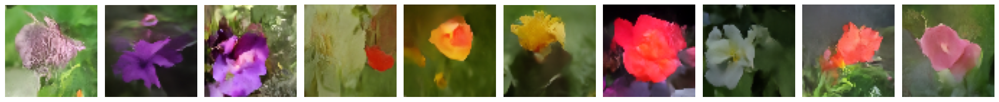

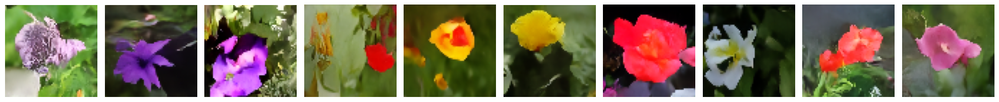

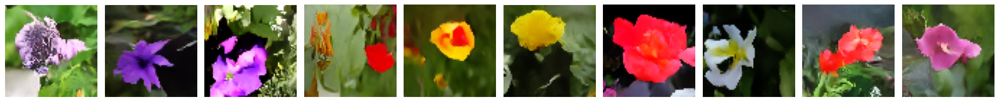

In [55]:
# Observar la mejora usando diferentes valores de pasos de diffusion
for diffusion_steps in list(np.arange(1, 6, 1)) + [20] + [100]:
    tf.random.set_seed(42)
    generated_images = loaded_ddm.generate(
        num_images=10,
        diffusion_steps=diffusion_steps,
    ).numpy()
    display(generated_images)

###4.3 Interpolación en el espacio del ruido

**Objetivo:** Visualizar cómo el modelo genera transiciones suaves entre dos imágenes sintéticas, al interpolar sus ruidos iniciales.

Muestra que el modelo ha aprendido un espacio latente continuo y semánticamente estructurado.

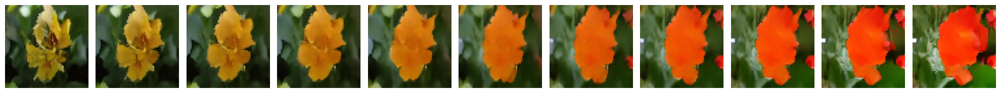

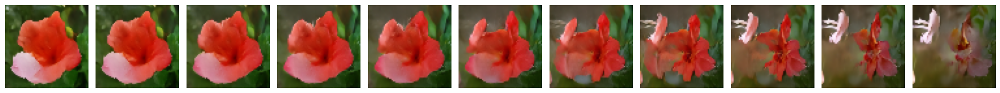

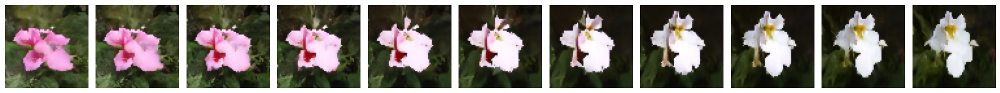

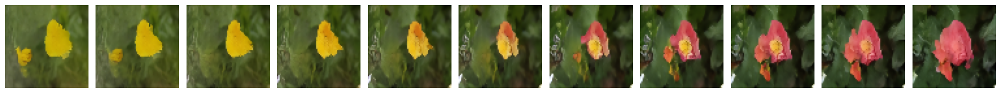

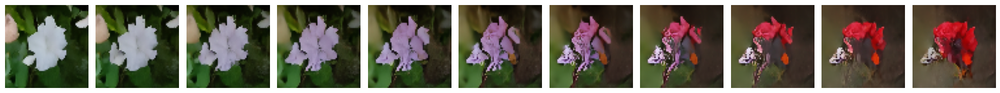

In [56]:
def spherical_interpolation_tf(a, b, t):
    """Interpolación esférica entre dos tensores en TensorFlow."""
    t = tf.cast(t, tf.float32)
    return tf.sin(t * math.pi / 2) * a + tf.cos(t * math.pi / 2) * b

# Generar interpolaciones en el espacio de ruido
tf.random.set_seed(100)

for i in range(5):
    a = tf.random.normal(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    b = tf.random.normal(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    t_values = tf.linspace(0.0, 1.0, 11)  # 11 pasos (0 → 1)
    initial_noise = tf.stack(
        [spherical_interpolation_tf(a, b, t) for t in t_values], axis=0
    )  # (11, 64, 64, 3)

    generated_images = loaded_ddm.generate(
        num_images=initial_noise.shape[0],
        diffusion_steps=20,
        initial_noise=initial_noise,
    ).numpy()

    display(generated_images, n=11)

